## Testing

Here the data preparation and data processing is implemented. Then, the generalisation ability of the model can be evaluated by considering the whole multi-center and multi-scanner dataset. Histogram matching can be applied as well. The GOAL is to test a model, which segments the left ventricle and the myocardium using LGE-MRI images, across all centers.  

##### Import libraries:

In [1]:
import nibabel as nib
import matplotlib.pyplot as plt
import random
import torch
import torch.nn as nn
import numpy as np
from tqdm import tqdm
import torch.nn.functional as F
import os 
import pandas as pd
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
from albumentations.augmentations.transforms import Rotate, RandomScale, Resize
import re
from skimage import measure, exposure
import cv2

##### Data preparation: 

In [2]:
#Function to load nifti files

def load_nii(path): 
    data = nib.load(path)
    return data.get_fdata()

Define paths to testing folders to access LGE-MRI volumes and the corresponding masks: 

In [3]:
name_test = ['EMIDEC', 'MSCMR', 'VH', 'STPAU'] #clinical centers

In [4]:
data_path_test = {}
listdir_test = {}
df_test = {}

for name in name_test: 

    data_path_test[name] = ('/home/carla/Desktop/euCanSHare/Datasets/testing/testing_{}').format(name)
    listdir_test[name] = os.listdir(data_path_test[name])
    df_test[name] = pd.DataFrame({'patient': listdir_test[name]})
    print(df_test[name].shape)

(15, 1)
(15, 1)
(15, 1)
(15, 1)


In [5]:
imgs_path_test = {}
masks_path_test = {}

for name in name_test: 

    imgs_path_test[name] = [d + '/' + 'patient' + re.findall(r'\d+', d)[0] + '_LGE.nii.gz' for d in df_test[name].patient]
    masks_path_test[name] = [d + '/' + 'patient' + re.findall(r'\d+', d)[0] + '_LGE_gt.nii.gz' for d in df_test[name].patient]

In [6]:
#Function to load the data volumes and masks to save each slice in .npy format and in separate folders

def generate_slices(data_path, df_path, imgs_path, masks_path): 
    
    for ix, p in enumerate (tqdm(df_path.patient)): 
        if "VH" in imgs_path[ix] or "STPAU" in imgs_path[ix]:
            v_lge = load_nii('{}/{}'.format(data_path, imgs_path[ix]))[:,:,:,0]
            v_gt = load_nii('{}/{}'.format(data_path, masks_path[ix]))[:,:,:,0]
        else: 
            v_lge = load_nii('{}/{}'.format(data_path, imgs_path[ix]))
            v_gt = load_nii('{}/{}'.format(data_path, masks_path[ix]))
            
        img_folder = '{}/{}/img_slices'.format(data_path, p)
        if not os.path.exists(img_folder): 
            os.mkdir(img_folder)
        channels = v_lge.shape[2]
        for c in range (channels):
            img = v_lge[:, :, c]
            if img.shape[0] < img.shape[1]: #rotation of the image, so that all have a similar size (.shape[0] > .shape[1])
                img = np.rot90(img)  
            np.save('{}/img_{}'.format(img_folder,c) + '.npy', img)

        mask_folder = '{}/{}/gt_slices'.format(data_path, p)
        if not os.path.exists(mask_folder): 
            os.mkdir(mask_folder)
        channels = v_gt.shape[2]
        for c in range (channels):
            gt = np.array(v_gt[:, :, c], dtype=np.uint8)
            if gt.shape[0] < gt.shape[1]:
                gt = np.rot90(gt)
            np.save('{}/gt_{}'.format(mask_folder,c) + '.npy', gt)

Load volumes and masks and save each slice as .npy file in separate folders:

In [7]:
for name in name_test: 
    generate_slices(data_path_test[name], df_test[name], imgs_path_test[name], masks_path_test[name])

100%|██████████| 15/15 [00:00<00:00, 18.80it/s]


In [8]:
len(df_test['EMIDEC']), len(df_test['MSCMR']), len(df_test['VH']), len(df_test['STPAU']) #number of testing subjects per center

(15, 15, 15, 15)

Define paths to call folder with .npy slices

In [9]:
img_path_test = {}
gt_path_test = {}

for name in name_test: 

    img_path_test[name] = [d + '/img_slices' for d in df_test[name].patient]
    gt_path_test[name] = [d + '/gt_slices' for d in df_test[name].patient]

Visualisation of images and groundtruths of the testing data to make sure that the data is loaded properly: 

3
(512, 512) float64 254.9999999406282 0.0
(512, 512) uint8 3 0


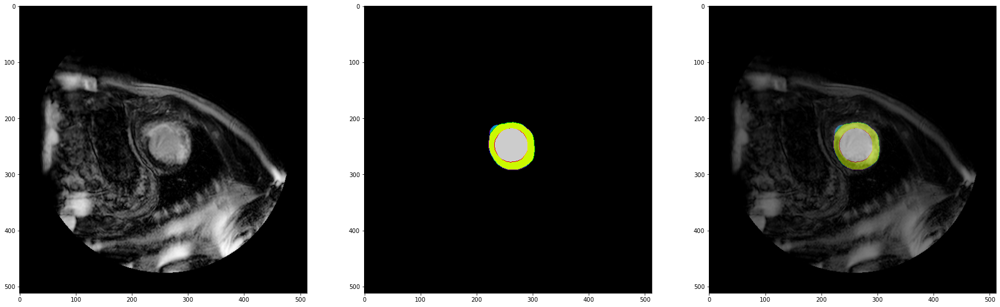

In [10]:
name = 'MSCMR'
fig, (ax1, ax2, ax3) = plt.subplots(1, 3,figsize=(30,10))
ix = random.randint(0, len(gt_path_test)-1)
channel = random.randint(0, 4)
img = np.load('{}/{}/img_{}.npy'.format(data_path_test[name], img_path_test[name][ix], channel))
gt = np.load('{}/{}/gt_{}.npy'.format(data_path_test[name], gt_path_test[name][ix], channel))
ax1.imshow(img[:,:], cmap='gist_gray')
ax2.imshow(gt[:,:], cmap='nipy_spectral')
ax3.imshow(img[:,:], cmap='gist_gray')
ax3.imshow(gt[:,:], alpha=0.5, cmap='nipy_spectral')

print(channel)
print(img.shape, img.dtype, img.max(), img.min())
print(gt.shape, gt.dtype, gt.max(), gt.min())

In [11]:
#Function to obtain center coordinates

def get_center_crop_coords(width, height, crop_width, crop_height):
    y1 = (width - crop_width) // 2
    y2 = y1 + crop_width
    x1 = (height - crop_height) // 2
    x2 = x1 + crop_height
    return x1, y1, x2, y2

#Function to implement a center cropping

def center_crop(img, gt, crop_width, crop_height):
    width, height = img.shape[:2]
    case = 0
    
    if width <= 256 and height >= 256: #crop height
        crop = 256
        x1 = (height - crop) // 2
        x2 = x1 + crop
        y1 = 0
        y2 = width
        case = 1
    
    if width >= 256 and height <= 256: #crop width
        crop = 256
        y1 = (width - crop) // 2
        y2 = y1 + crop 
        x1 = 0
        x2 = height
        case = 2
        
    if width >= 256 and height >= 256: #crop both 
        x1, y1, x2, y2 = get_center_crop_coords(width, height, crop_width, crop_height)
        case = 3
    
    if width <= 256 and height <= 256: #crop none of them
        case = 4

    sum_MYO_LV = gt.sum() #make sure the gt is not removed
    count = 0
    while True:
        if case == 1: 
            y1 = 0
            y2 = width
            img_cropped = img[y1:y2, x1:x2]
            gt_cropped = gt[y1:y2, x1:x2]
        if case == 2: 
            x1 = 0
            x2 = height 
            img_cropped = img[y1:y2, x1:x2]
            gt_cropped = gt[y1:y2, x1:x2]
        if case == 3: 
            img_cropped = img[y1:y2, x1:x2]
            gt_cropped = gt[y1:y2, x1:x2]
        else: 
            img_cropped = img
            gt_cropped = gt
        
        if gt_cropped.sum() == sum_MYO_LV: 
            #gt is not removed
            break
        
        #gt is removed
        
        #go for a center cropping 
        if count == 0:   
            x1, y1, x2, y2 = get_center_crop_coords(width, height, crop_width, crop_height)
        #else:
        if count > 0 and count < 30: #shorten height 
            x1 += 10
            x2 -= 10
        if count == 30: 
            x1, y1, x2, y2 = get_center_crop_coords(width, height, crop_width, crop_height)
        
        if count > 30 and count < 60: #lengthen height 
            x2 += 10
            x1 -= 10
        if count == 60: 
            x1, y1, x2, y2 = get_center_crop_coords(width, height, crop_width, crop_height)            
        
        if count > 60 and count < 90: #shorten width 
            y1 += 10
            y2 -= 10
        if count == 90: 
            x1, y1, x2, y2 = get_center_crop_coords(width, height, crop_width, crop_height) 
        
        if count > 90 and count < 120: #lengthen width 
            y2 += 10
            y1 -= 10
        if count == 120: 
            x1, y1, x2, y2 = get_center_crop_coords(width, height, crop_width, crop_height)            
        
        if count > 120 and count < 150: #lengthen width and height
            y2 += 10
            y1 -= 10
            x2 += 10
            x1 -= 10
        if count == 150: 
            x1, y1, x2, y2 = get_center_crop_coords(width, height, crop_width, crop_height)            
        
        if count > 150 and count < 180: #legthen width and shorten height
            y2 += 10
            y1 -= 10
            x2 -= 10
            x1 += 10
        if count == 180: 
            x1, y1, x2, y2 = get_center_crop_coords(width, height, crop_width, crop_height)            
        
        if count > 180 and count < 210: #shorten width and height
            y2 -= 10
            y1 += 10
            x2 -= 10
            x1 += 10
        if count == 210: 
            x1, y1, x2, y2 = get_center_crop_coords(width, height, crop_width, crop_height)            
        
        if count > 210: #shorten width and lengthen height
            y2 -= 10
            y1 += 10
            x2 += 10
            x1 -= 10
        count += 1
    
    if img_cropped.shape[0] != 256 or img_cropped.shape[1] != 256: #if the size is not the desired one resize
        resize = Resize(256, 256)
        img_cropped = resize(image=img_cropped)['image']
        gt_cropped = resize(image=gt_cropped)['image']
               
    return img_cropped, gt_cropped

In [12]:
#Function to obtain random coordinates

def get_random_crop_coords(width, height, crop_width, crop_height, h_start, w_start):
    y1 = int((width - crop_width) * h_start)
    y2 = y1 + crop_width
    x1 = int((height - crop_height) * w_start)
    x2 = x1 + crop_height
    return x1, y1, x2, y2


#Function to implement a random cropping

def random_crop(img, gt, crop_width, crop_height):
    width, height = img.shape[:2]
    case = 0
    
    if width <= 256 and height >= 256: #crop height
        crop = 256
        x1 = (height - crop) // 2
        x2 = x1 + crop
        y1 = 0
        y2 = width
        case = 1
    
    if width >= 256 and height <= 256: #crop width
        crop = 256
        y1 = (width - crop) // 2
        y2 = y1 + crop 
        x1 = 0
        x2 = height
        case = 2
        
    if width >= 256 and height >= 256: #crop both 
        h_start = random.random()
        w_start = random.random()
        x1, y1, x2, y2 = get_random_crop_coords(width, height, crop_width, crop_height, h_start, w_start)
        case = 3
    
    if width <= 256 and height <= 256: #crop none of them
        case = 4

    sum_MYO_LV = gt.sum() #make sure the gt is not removed
    count = 0
    while True:
        if case == 1: 
            y1 = 0
            y2 = width
            img_cropped = img[y1:y2, x1:x2]
            gt_cropped = gt[y1:y2, x1:x2]
        if case == 2: 
            x1 = 0
            x2 = height 
            img_cropped = img[y1:y2, x1:x2]
            gt_cropped = gt[y1:y2, x1:x2]
        if case == 3: 
            img_cropped = img[y1:y2, x1:x2]
            gt_cropped = gt[y1:y2, x1:x2]
        else: 
            img_cropped = img
            gt_cropped = gt
        
        if gt_cropped.sum() == sum_MYO_LV: 
            #gt is not removed
            break
        
        #gt is removed
        if count<15: #try random coordinates 14 times more    
            h_start = random.random()
            w_start = random.random()
            x1, y1, x2, y2 = get_random_crop_coords(width, height, crop_width, crop_height, h_start, w_start)     
        
        #otherwise go for a center cropping 
        if count == 15:   
            x1, y1, x2, y2 = get_center_crop_coords(width, height, crop_width, crop_height)
        #else:
        if count > 15 and count < 45: #shorten height 
            x1 += 10
            x2 -= 10
        if count == 45: 
            x1, y1, x2, y2 = get_center_crop_coords(width, height, crop_width, crop_height)
        
        if count > 45 and count < 75: #lengthen height 
            x2 += 10
            x1 -= 10
        if count == 75: 
            x1, y1, x2, y2 = get_center_crop_coords(width, height, crop_width, crop_height)            
        
        if count > 75 and count < 105: #shorten width 
            y1 += 10
            y2 -= 10
        if count == 105: 
            x1, y1, x2, y2 = get_center_crop_coords(width, height, crop_width, crop_height) 
        
        if count > 105 and count < 135: #lengthen width 
            y2 += 10
            y1 -= 10
        if count == 135: 
            x1, y1, x2, y2 = get_center_crop_coords(width, height, crop_width, crop_height)            
        
        if count > 135 and count < 165: #lengthen width and height
            y2 += 10
            y1 -= 10
            x2 += 10
            x1 -= 10
        if count == 165: 
            x1, y1, x2, y2 = get_center_crop_coords(width, height, crop_width, crop_height)            
        
        if count > 165 and count < 195: #legthen width and shorten height
            y2 += 10
            y1 -= 10
            x2 -= 10
            x1 += 10
        if count == 195: 
            x1, y1, x2, y2 = get_center_crop_coords(width, height, crop_width, crop_height)            
        
        if count > 195 and count < 225: #shorten width and height
            y2 -= 10
            y1 += 10
            x2 -= 10
            x1 += 10
        if count == 225: 
            x1, y1, x2, y2 = get_center_crop_coords(width, height, crop_width, crop_height)            
        
        if count > 225: #shorten width and lengthen height
            y2 -= 10
            y1 += 10
            x2 += 10
            x1 -= 10
        count += 1
    
    if img_cropped.shape[0] != 256 or img_cropped.shape[1] != 256: #if the size is not the desired one resize
        resize = Resize(256, 256)
        img_cropped = resize(image=img_cropped)['image']
        gt_cropped = resize(image=gt_cropped)['image']
               
    return img_cropped, gt_cropped

In [13]:
#Funtion to keep only the largest connected components in the mask  

def keep_largest_connected_components(mask):
    '''
    Keeps only the largest connected components of each label for a segmentation mask.
    '''

    out_img = np.zeros(mask.shape, dtype=np.uint8)

    for struc_id in [1, 2, 3]:

        binary_img = mask == struc_id
        blobs = measure.label(binary_img, connectivity=1)

        props = measure.regionprops(blobs)

        if not props:
            continue

        area = [ele.area for ele in props]
        largest_blob_ind = np.argmax(area)
        largest_blob_label = props[largest_blob_ind].label

        out_img[blobs == largest_blob_label] = struc_id

    return out_img

Create the DataLoader:

In [14]:
class MRIDataset(Dataset): 
    def __init__(self, data_path, img_path, gt_path, num_classes=3):
        self.data_path = data_path
        self.img_path = img_path
        self.gt_path = gt_path
        self.num_classes = num_classes
    def __len__(self):
        return len(self.img_path) 
    def __getitem__(self, ix): #slice by slice 
                
        img = np.load('{}/{}'.format(self.data_path, self.img_path[ix]))
                
        gt = np.load('{}/{}'.format(self.data_path, self.gt_path[ix]))
        
        if "MSCMR" in self.img_path[ix]: 
            self.num_classes = 4 
        if "EMIDEC" in self.img_path[ix]:
            mask = img>0 #remove black background
            img = img[np.ix_(mask.any(1),mask.any(0))]
            gt = gt[np.ix_(mask.any(1),mask.any(0))]
            self.num_classes = 5
        if "VH" in self.img_path[ix]: 
            mask = img>0
            img = img[np.ix_(mask.any(1),mask.any(0))]
            gt = gt[np.ix_(mask.any(1),mask.any(0))]
                                     
        [img, gt] = center_crop(img, gt, 256, 256) #cropping
        
        img = np.array((img-np.min(img))/(np.max(img)-np.min(img)), dtype=np.float32) #max-min normalisation
                                
        #img_reference = np.load('../../Reference/ref_EMIDEC_post.npy') 
        #img = exposure.match_histograms(img, img_reference) #histogram matching
                             
        gt = (np.arange(self.num_classes) == gt[...,None]).astype(int) #create binary gt
        
        if "MSCMR" in self.img_path[ix]: #remove noise from the resize of the groundtruth
            gt[:,:,3] = keep_largest_connected_components(gt[:,:,3])
        else:
            gt[:,:,1] = keep_largest_connected_components(gt[:,:,1])        
        
        #keep only 3 labels: BG (0), MYO(1) and LV(2)
        if "MSCMR" in self.img_path[ix]:
            gt[:, :, 0] += gt[:, :, 1] #0:BG
            gt[:, :, 1] = gt[:, :, 2] #1:MYO
            gt[:, :, 2] = gt[:, :, 3] #2:LV
            gt = gt[:, :, 0:3] 
            
        if "EMIDEC" in self.img_path[ix]:            
            gt[:,:,3] += gt[:,:,2] #1:MYO
            gt[:,:,3] += gt[:,:,4] #1:MYO
            gt[:,:,2] = gt[:,:,1] #2:LV
            gt[:,:,1] = gt[:,:,3] #1:MYO
            gt = gt [:,:,0:3]
            
        if "VH" in self.img_path[ix] or "STPAU" in self.img_path[ix]: 
            gt_ = np.zeros((gt.shape))
            gt_[:,:,0] = gt[:,:,0] #0:BG
            gt_[:,:,1] = gt[:,:,2] #1:MYO
            gt_[:,:,2] = gt[:,:,1] #2:LV
            gt = gt_
                 
        gt[:,:,0] = np.ones((gt.shape[0], gt.shape[1])) - gt[:, :, 1] - gt[:, :, 2]
        
        return torch.from_numpy(img).unsqueeze(0).float(), torch.from_numpy(gt.transpose((2,0,1))).float()

Define paths to call .npy slices:

In [15]:
img_test = {}
gt_test = {}
for name in name_test: 
    for patient in img_path_test[name]:
        if name in img_test: 
            img_test[name] += ['{}/{}'.format(patient,i) for i in sorted(os.listdir('{}/{}'.format(data_path_test[name], patient)))]
        else: 
            img_test[name] = ['{}/{}'.format(patient,i) for i in sorted(os.listdir('{}/{}'.format(data_path_test[name], patient)))] 
    for patient in gt_path_test[name]:
        if name in gt_test: 
            gt_test[name] += ['{}/{}'.format(patient,i) for i in sorted(os.listdir('{}/{}'.format(data_path_test[name], patient)))]
        else: 
            gt_test[name] = ['{}/{}'.format(patient,i) for i in sorted(os.listdir('{}/{}'.format(data_path_test[name], patient)))] 

Define DataLoader for the testing data:

In [16]:
dataset = { 
    'test_EMIDEC': MRIDataset(data_path_test['EMIDEC'], img_test['EMIDEC'], gt_test['EMIDEC']),
    'test_MSCMR': MRIDataset(data_path_test['MSCMR'], img_test['MSCMR'], gt_test['MSCMR']),
    'test_VH': MRIDataset(data_path_test['VH'], img_test['VH'], gt_test['VH']),
    'test_STPAU': MRIDataset(data_path_test['STPAU'], img_test['STPAU'], gt_test['STPAU'])
}

len(dataset['test_EMIDEC']), len(dataset['test_MSCMR']), len(dataset['test_VH']), len(dataset['test_STPAU']) #number of samples per center

(106, 222, 159, 308)

Visualisation of images and groundtruths of the training data to make sure that the data is processed properly: 

torch.Size([1, 256, 256]) torch.float32 tensor(1.) tensor(0.)
torch.Size([3, 256, 256]) torch.float32 tensor(1.) tensor(0.) True


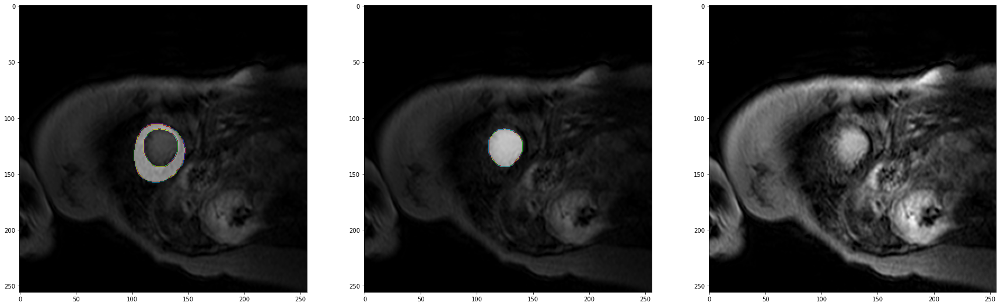

In [17]:
ds = dataset['test_STPAU']
fig, (ax1, ax2, ax3) = plt.subplots(1, 3,figsize=(30,10))
ix = random.randint(0, len(ds)-1)
img, gt = ds[ix]
print(img.shape, img.dtype, img.max(), img.min())
print(gt.shape, gt.dtype, gt.max(), gt.min(), gt.sum().item() == gt.shape[1]*gt.shape[2])
_img = img.numpy().transpose((1,2,0))
ax1.imshow(_img[:, :, 0].squeeze(), cmap='gist_gray') 
ax2.imshow(_img[:, :, 0].squeeze(), cmap='gist_gray')
ax3.imshow(_img[:, :, 0].squeeze(), cmap='gist_gray')
_gt = gt.numpy().transpose((1,2,0))
ax1.imshow(_gt[:,:,1], alpha=0.6, cmap='nipy_spectral')
ax2.imshow(_gt[:,:,2], alpha=0.6, cmap='nipy_spectral')

Define batch size for each DataLoader:

In [18]:
dataloader = {
    'test_EMIDEC': DataLoader(dataset['test_EMIDEC'], batch_size=1, shuffle=False, num_workers=4),
    'test_MSCMR': DataLoader(dataset['test_MSCMR'], batch_size=1, shuffle=False, num_workers=4),
    'test_VH': DataLoader(dataset['test_VH'], batch_size=1, shuffle=False, num_workers=4),
    'test_STPAU': DataLoader(dataset['test_STPAU'], batch_size=1, shuffle=False, num_workers=4),
}

##### Testing implementation: 

Model:

In [19]:
class DoubleConvNN(nn.Module):

    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.double_conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.InstanceNorm2d(out_channels),
            nn.LeakyReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.InstanceNorm2d(out_channels),
            nn.LeakyReLU(inplace=True)
        )

    def forward(self, x):
        return self.double_conv(x)     

class UpsampleNN(nn.Module):

    def __init__(self, in_channels, out_channels, bilinear=True):
        super().__init__()

        self.upsample = nn.ConvTranspose2d(in_channels , out_channels, kernel_size=3, stride=2)
        self.conv = DoubleConvNN(in_channels, out_channels)


    def forward(self, x1, x2):
        x1 = self.upsample(x1)
        diffY = x2.size()[2] - x1.size()[2]
        diffX = x2.size()[3] - x1.size()[3]

        x1 = F.pad(x1, [diffX // 2, diffX - diffX // 2,
                      diffY // 2, diffY - diffY // 2])
        x = torch.cat([x2, x1], dim=1)
        return self.conv(x) 

class nnUNet(nn.Module):
    def __init__(self, num_labels): 
        super().__init__()

        self.inconv = DoubleConvNN(1, 32)

        self.maxpool1 = nn.MaxPool2d(2)
        self.conv1 = DoubleConvNN(32, 64)
        self.maxpool2 = nn.MaxPool2d(2)
        self.conv2 = DoubleConvNN(64, 128)
        self.maxpool3 = nn.MaxPool2d(2)
        self.conv3 = DoubleConvNN(128, 256)
        self.maxpool4 = nn.MaxPool2d(2)
        self.conv4 = DoubleConvNN(256, 512)
        self.maxpool5 = nn.MaxPool2d(2)
        self.conv5 = DoubleConvNN(512, 1024)
        
        self.upsample1 = UpsampleNN(1024, 512)
        self.upsample2 = UpsampleNN(512, 256)
        self.upsample3 = UpsampleNN(256, 128)
        self.upsample4 = UpsampleNN(128, 64)
        self.upsample5 = UpsampleNN(64, 32)

        self.outconv = nn.Conv2d(32, num_labels, kernel_size=1)

        self.deep_conv1 = nn.Conv2d(512, num_labels, kernel_size=1)
        self.deep_conv2 = nn.Conv2d(256, num_labels, kernel_size=1)
        self.deep_conv3 = nn.Conv2d(128, num_labels, kernel_size=1)
        self.deep_conv4 = nn.Conv2d(64, num_labels, kernel_size=1)

        self.deep_deconv = nn.ConvTranspose2d(num_labels, num_labels, kernel_size=3, stride=2)

    def forward(self, x):
        x1 = self.inconv(x)

        x2 = self.maxpool1(x1)
        x2 = self.conv1(x2)
        x3 = self.maxpool2(x2)
        x3 = self.conv2(x3)
        x4 = self.maxpool3(x3)
        x4 = self.conv3(x4)
        x5 = self.maxpool4(x4)
        x5 = self.conv4(x5)
        x6 = self.maxpool5(x5)
        x6 = self.conv5(x6)

        x  = self.upsample1(x6, x5)
        x_ = self.deep_conv1(x)
        x1_deep = self.deep_deconv(x_)
        
        x = self.upsample2(x, x4)
        x_ = self.deep_conv2(x)
        diffY = x_.size()[2] - x1_deep.size()[2]
        diffX = x_.size()[3] - x1_deep.size()[3]
        x1_deep = F.pad(x1_deep, [diffX // 2, diffX - diffX // 2,
                      diffY // 2, diffY - diffY // 2])
        x_ = torch.add(x1_deep, x_)
        x2_deep = self.deep_deconv(x_)

        x = self.upsample3(x, x3)
        x_ = self.deep_conv3(x)
        diffY = x_.size()[2] - x2_deep.size()[2]
        diffX = x_.size()[3] - x2_deep.size()[3]
        x2_deep = F.pad(x2_deep, [diffX // 2, diffX - diffX // 2,
                      diffY // 2, diffY - diffY // 2])
        x_ = torch.add(x2_deep, x_)
        x3_deep = self.deep_deconv(x_)

        x = self.upsample4(x, x2)     
        x_ = self.deep_conv4(x)
        diffY = x_.size()[2] - x3_deep.size()[2]
        diffX = x_.size()[3] - x3_deep.size()[3]
        x3_deep = F.pad(x3_deep, [diffX // 2, diffX - diffX // 2,
                      diffY // 2, diffY - diffY // 2])
        x_ = torch.add(x3_deep, x_)
        x4_deep = self.deep_deconv(x_)

        x = self.upsample5(x, x1)

        x = self.outconv(x)

        diffY = x.size()[2] - x4_deep.size()[2]
        diffX = x.size()[3] - x4_deep.size()[3]
        x4_deep = F.pad(x4_deep, [diffX // 2, diffX - diffX // 2,
                      diffY // 2, diffY - diffY // 2])

        x = torch.add(x4_deep, x)
        return x

In [20]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

model = nnUNet(num_labels=3)

input_image = torch.randn((8,1,256,200))
output = model(input_image)
print(output.shape) # Batches x Classes x Height x Width

torch.Size([8, 3, 256, 200])


In [21]:
model.to(device)

nnUNet(
  (inconv): DoubleConvNN(
    (double_conv): Sequential(
      (0): Conv2d(1, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): InstanceNorm2d(32, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
      (2): LeakyReLU(negative_slope=0.01, inplace=True)
      (3): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): InstanceNorm2d(32, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
      (5): LeakyReLU(negative_slope=0.01, inplace=True)
    )
  )
  (maxpool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv1): DoubleConvNN(
    (double_conv): Sequential(
      (0): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): InstanceNorm2d(64, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
      (2): LeakyReLU(negative_slope=0.01, inplace=True)
      (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): Instan

Dice coefficient:

In [22]:
def dice_batch_multiclass(outputs, target, numpy=False): #metric definition
    smooth = 1.
    
    if numpy: #input is a numpy and by subject
        #flatten label and prediction tensors
        
        iflat = outputs[:,:,:,1].reshape(-1)
        tflat = target[:,:,:,1].reshape(-1)
        intersection = (iflat * tflat).sum()
        A_sum = np.sum(iflat * iflat)
        B_sum = np.sum(tflat * tflat)
        dice_1 = ((2. * intersection + smooth) / (A_sum + B_sum + smooth))
        
        iflat = outputs[:,:,:,2].reshape(-1)
        tflat = target[:,:,:,2].reshape(-1)
        intersection = (iflat * tflat).sum()
        A_sum = np.sum(iflat * iflat)
        B_sum = np.sum(tflat * tflat)
        dice_2 = ((2. * intersection + smooth) / (A_sum + B_sum + smooth))
        
        
    else: #input is a tensor
        
        pred = torch.sigmoid(outputs)
        
        iflat = pred[:,1,:,:].contiguous().view(-1)
        tflat = target[:,1,:,:].contiguous().view(-1)
        intersection = (iflat * tflat).sum()
        A_sum = torch.sum(iflat * iflat)
        B_sum = torch.sum(tflat * tflat)
        dice_1 = ((2. * intersection + smooth) / (A_sum + B_sum + smooth))
        
        iflat = pred[:,2,:,:].contiguous().view(-1)
        tflat = target[:,2,:,:].contiguous().view(-1)
        intersection = (iflat * tflat).sum()
        A_sum = torch.sum(iflat * iflat)
        B_sum = torch.sum(tflat * tflat)
        dice_2 = ((2. * intersection + smooth) / (A_sum + B_sum + smooth))
        
    return dice_1, dice_2

Load the best model: 

In [27]:
model.load_state_dict(torch.load('../../Models/state_dict_tl.pth')['model_state_dict'])

<All keys matched successfully>

Test of the dataset using the average DC by slice: 

In [28]:
vols_lge_d = {}
masks_lge_d = {}
preds_lge_d = {}

model.eval()
for name in name_test: 
    dcs_lv = []
    dcs_myo = []
    
    vols_lge = []
    masks_lge = []
    preds_lge = []
    
    for img, gt in dataloader['test_'+name]: #get slice

        pred = model(img.to(device)) #prediction
    
        (dc_myo, dc_lv) = dice_batch_multiclass(pred.detach().cpu(), gt.detach().cpu()) #measure DC per slice
        dcs_lv.append(dc_lv)
        dcs_myo.append(dc_myo)

        pred = torch.sigmoid(pred.detach().cpu()).numpy() #apply sigmoid and put 1 in the class with max prob
        pred_ = np.zeros_like(pred)
        for i in range (pred.shape[2]): 
            pred_[0, pred[0, :, i, np.arange(pred.shape[3])].argmax(axis=1), i, np.arange(pred.shape[3])] = 1.

        _gt = np.zeros((gt.shape[2], gt.shape[3])) #from binary to classes: 0,1,2
        _gt = gt[0,1,:,:]==1
        _gt = _gt + (gt[0,2,:,:]==1)*2

        _pred = np.zeros((pred_.shape[2], pred_.shape[3])) #from binary to classes: 0,1,2
        _pred = pred_[0,1,:,:]==1
        _pred = _pred + (pred_[0,2,:,:]==1)*2
        
        _pred = keep_largest_connected_components(_pred)
        
        masks_lge.append(_gt.numpy()) #join all GT slices
        vols_lge.append(img.squeeze(0).squeeze(0).detach().cpu().numpy()) #join all slices
        preds_lge.append(_pred) #join all predictions

        vols_lge_d[name] = np.array(vols_lge) #to array
        masks_lge_d[name] = np.array(masks_lge) #to array
        preds_lge_d[name] = np.array(preds_lge) #to array  
    print(name + ': DC LV: {:.5f}'.format(np.mean(dcs_lv)) + ' DC MYO: {:.5f}'.format(np.mean(dcs_myo))) #DC averaging by all slices

EMIDEC: DC LV: 0.88285 DC MYO: 0.78934
MSCMR: DC LV: 0.87993 DC MYO: 0.75162
VH: DC LV: 0.61772 DC MYO: 0.50689
STPAU: DC LV: 0.79248 DC MYO: 0.69096


Testing by subject:

In [29]:
for name in name_test: 
    dcs_lv = []
    dcs_myo = []
    num_c = []
    last = 0
    nxt = 0
    dcs = []

    for ix, subj in enumerate (df_test[name].patient): #by subject

        listdir_test_img = sorted(os.listdir('{}/{}'.format(data_path_test[name], img_path_test[name][ix])))

        num_c = len(listdir_test_img)

        mask_lge = np.zeros((masks_lge_d[name].shape[1], masks_lge_d[name].shape[2], num_c))
        pred_lge = np.zeros((preds_lge_d[name].shape[1], preds_lge_d[name].shape[2], num_c))

        dc_lv = []
        dc_myo = []

        gt = (np.arange(3) == masks_lge_d[name][last:last+num_c, :, :][...,None]).astype(int)
        pred = (np.arange(3) == preds_lge_d[name][last:last+num_c, :, :][...,None]).astype(int)
                
        dc_myo.append(dice_batch_multiclass(pred, gt, numpy=True)[0]) #DC measure of each slice
        dc_lv.append(dice_batch_multiclass(pred, gt, numpy=True)[1])

        nxt += num_c
        last = nxt

        dcs_myo.append(np.mean(dc_myo)) #DC measure of each subject
        dcs_lv.append(np.mean(dc_lv))
        dcs.append(np.mean([dc_myo, dc_lv]))
    print(name + ': DC LV: {:.5f}'.format(np.mean(dcs_lv)) + ' DC MYO: {:.5f}'.format(np.mean(dcs_myo))) #DC averaging by subject

EMIDEC: DC LV: 0.90347 DC MYO: 0.78158
MSCMR: DC LV: 0.88600 DC MYO: 0.74728
VH: DC LV: 0.77245 DC MYO: 0.58851
STPAU: DC LV: 0.87623 DC MYO: 0.75246


Plot of predictions by subject:

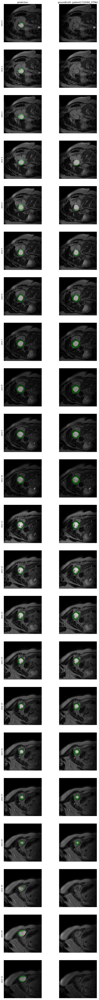

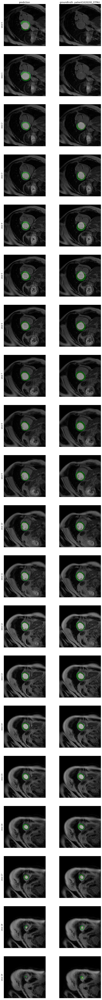

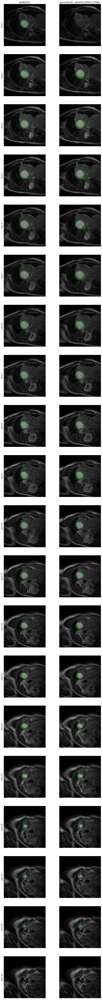

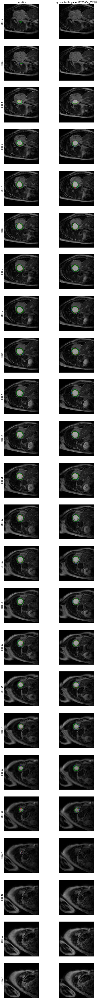

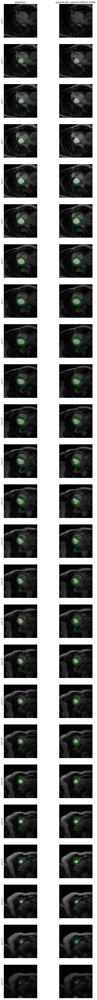

...

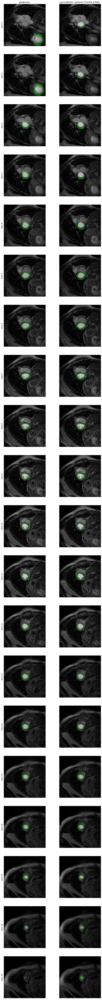

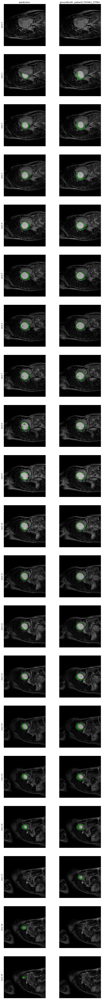

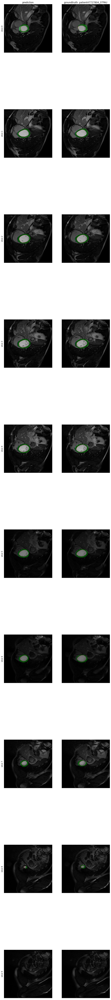

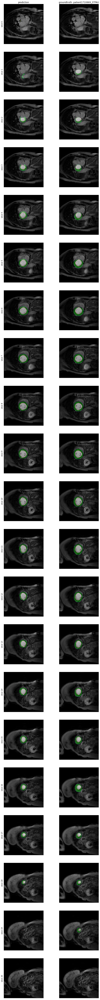

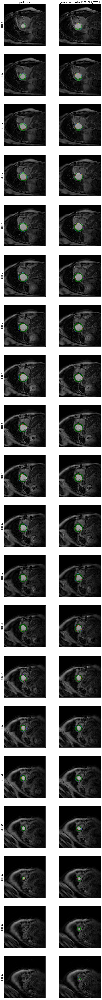

In [30]:
last = 0
nxt = 0
figs = {}
name = 'STPAU' #choose center

for ix, subj in enumerate (df_test[name].patient):

    num_patient = int(re.findall(r'\d+', subj)[0])  
    nmask_lge = nib.load('{}/{}/{}'.format(data_path_test[name], subj, 'patient' + str(num_patient) + '_LGE_gt.nii.gz'))
    nvol_lge = nib.load('{}/{}/{}'.format(data_path_test[name], subj, 'patient' + str(num_patient) + '_LGE.nii.gz'))

    nmask_lge_data = nmask_lge.get_fdata()
    nvol_lge_data = nvol_lge.get_fdata()
    
    if name == 'VH' or name == 'STPAU': 
        nmask_lge_data = nmask_lge_data[:,:,:,0]
        nvol_lge_data = nvol_lge_data[:,:,:,0]
    
    nvol_lge_data_ = []
    nmask_lge_data_ = []
    for i in range (nvol_lge_data.shape[2]):
        if name == 'EMIDEC':
            mask = nvol_lge_data[:,:,i]>0 #remove black background
            img = nvol_lge_data[:,:,i][np.ix_(mask.any(1),mask.any(0))]
            gt = nmask_lge_data[:,:,i][np.ix_(mask.any(1),mask.any(0))]
        if name == 'VH': 
            mask = nvol_lge_data[:,:,i]>0.
            img = nvol_lge_data[:,:,i][np.ix_(mask.any(1),mask.any(0))]
            gt = nmask_lge_data[:,:,i][np.ix_(mask.any(1),mask.any(0))]
        else: 
            img = nvol_lge_data[:,:,i]
            gt = nmask_lge_data[:,:,i]
        
        [img, gt] = center_crop(img, gt, 256, 256) #cropping
        nvol_lge_data_.append(img)
        nmask_lge_data_.append(gt)
    nmask_lge_data = np.array(nmask_lge_data_).transpose(1,2,0)
        
    listdir_test_img = sorted(os.listdir('{}/{}'.format(data_path_test[name], img_path_test[name][ix])))
    num_c = len(listdir_test_img)
        
    vol_lge = np.zeros((vols_lge_d[name].shape[1], vols_lge_d[name].shape[2], num_c))
    mask_lge = np.zeros((masks_lge_d[name].shape[1], masks_lge_d[name].shape[2], num_c))
    pred_lge = np.zeros((preds_lge_d[name].shape[1], preds_lge_d[name].shape[2], num_c))
    

    for i, s in enumerate(listdir_test_img):
        num_slice = int(re.findall(r'\d+', s)[0])
        
        vol_lge[:, :, num_slice] = vols_lge_d[name][last+i, :, :]
        mask_lge[:, :, num_slice] = masks_lge_d[name][last+i, :, :]
        pred_lge[:, :, num_slice] = keep_largest_connected_components(preds_lge_d[name][last+i, :, :])
        
    nxt += num_c
    false_ix = (pred_lge-mask_lge) != 0 
    false = np.zeros((pred_lge.shape))
    false[false_ix] = 1
            
    fig, ax = plt.subplots(vol_lge.shape[2], 2, figsize=(10, 100)) 
    count1 = 0
    count2 = 1
    for i, axi in enumerate(ax.flat):
        if i%2 == 0:
            if i == 0: 
                axi.set_title('prediction') 
            axi.imshow(vol_lge[:, :, i-count1], cmap='gist_gray')
            axi.imshow(pred_lge[:, :, i-count1], alpha=0.4, cmap='nipy_spectral')
            #axi.imshow(false[:, :, i-count1], alpha=0.6, cmap='nipy_spectral')
            axi.set(xticks=[], yticks=[])
            axi.set_ylabel('slice ' + str(i-count1))
            count1 += 1
        else:
            if i ==1: 
                axi.set_title('groundtruth: ' + str(subj))
            axi.imshow(vol_lge[:, :, i-count2], cmap='gist_gray')
            axi.imshow(mask_lge[:, :, i-count2].astype(int), alpha=0.4, cmap='nipy_spectral')
            axi.set(xticks=[], yticks=[])
            count2 += 1

    figs['fig' + str(ix)] = fig
    
    
    last = nxt   